In [3]:
%matplotlib inline

In [8]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
from IPython.display import display

rc('animation', html='jshtml')

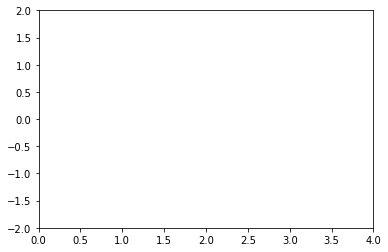

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
plt.style.use('seaborn-pastel')


fig = plt.figure()
ax = plt.axes(xlim=(0, 4), ylim=(-2, 2))
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,
def animate(i):
    x = np.linspace(0, 4, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)

display(anim)

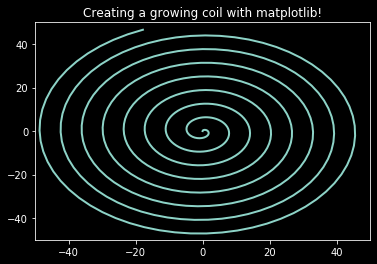

In [12]:
import matplotlib.pyplot as plt 
import matplotlib.animation as animation 
import numpy as np 
plt.style.use('dark_background')

fig = plt.figure() 
ax = plt.axes(xlim=(-50, 50), ylim=(-50, 50)) 
line, = ax.plot([], [], lw=2) 

# initialization function 
def init(): 
	# creating an empty plot/frame 
	line.set_data([], []) 
	return line, 

# lists to store x and y axis points 
xdata, ydata = [], [] 

# animation function 
def animate(i): 
	# t is a parameter 
	t = 0.1*i 
	
	# x, y values to be plotted 
	x = t*np.sin(t) 
	y = t*np.cos(t) 
	
	# appending new points to x, y axes points list 
	xdata.append(x) 
	ydata.append(y) 
	line.set_data(xdata, ydata) 
	return line, 
	
# setting a title for the plot 
plt.title('Creating a growing coil with matplotlib!') 
# hiding the axis details 
#plt.axis('off') 

# call the animator	 
anim = animation.FuncAnimation(fig, animate, init_func=init, 
							frames=500, interval=20, blit=True) 

# save the animation as mp4 video file 
anim
#anim.save('coil.gif',writer='imagemagick') 

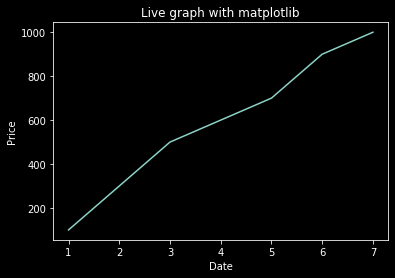

In [29]:
#importing libraries
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import re

fig = plt.figure()
#creating a subplot 
ax1 = fig.add_subplot(1,1,1)

def animate(i):
    with open('stock.txt', 'r') as infile:
        data = infile.read()
        #data = open('stock.txt','r').read()
        lines = data.split('\n')
        xs = []
        ys = []

        for line in lines:
            #print(f'line: #{line}#')
            if re.match(r'[0-9]+,[0-9]+', line):
                x, y = line.split(',') # Delimiter is comma    
                xs.append(float(x))
                ys.append(float(y))


        ax1.clear()
        ax1.plot(xs, ys)

        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title('Live graph with matplotlib')	
	
    
ani = animation.FuncAnimation(fig, animate, interval=1000)
plt.show()

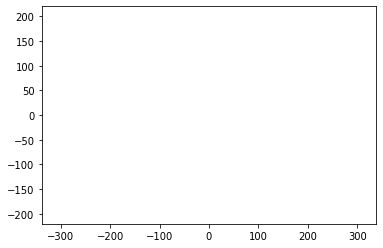

In [8]:
import numpy as np
import matplotlib

from matplotlib import pyplot as plt
from matplotlib.patches import Circle
from celluloid import Camera
from random import randint, random

def rand_pos(low=0, high=100):
    return ( randint(low,high), randint(low,high))

def random_color():
    return (random(),random(),random())

class Raindrop:
    def __init__(self, pos):
        self.pos = pos
        self.radius = 0
        self.alpha = 1
        self.energy = 10
        self.color = random_color()
        self.finished = False
    def __repr__(self):
        return f"<Raindrop pos:{self.pos}, radius:{self.radius}>"
    def tick(self):
        self.radius += 2
#         if self.alpha > 0.0:
#             self.alpha = max(0, self.alpha-0.01)
        #self.alpha = min(1,(self.energy/self.radius)**2)

    def as_circle(self):
        return Circle(self.pos,self.radius,linewidth=3, color=self.color, fill=False, alpha=self.alpha)


fig = plt.figure()
camera = Camera(fig)
ax = plt.gca()
ax.set_xlim(-200,200)
ax.set_ylim(-200,200)
ax.axis('equal')

# d = Raindrop(1,1)
drops = [ Raindrop(rand_pos(-200,200)) for i in range(5)]

for i in range(100):
    # add raindrops
    if random() > 0.2:
        drops.append(Raindrop(rand_pos(-200,200)))

    for d in drops:
        d.tick()
    circles = [d.as_circle() for d in drops]
    for c in circles:
        ax.add_patch(c)
    camera.snap()

ani = camera.animate()

ani.save('celluloid_minimal.mp4', writer = 'ffmpeg')

ani


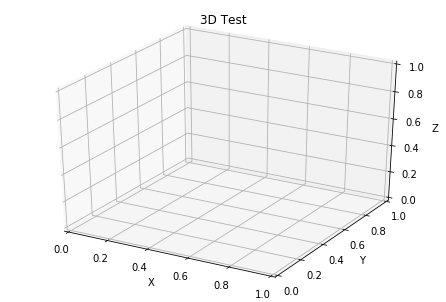

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

# Fixing random state for reproducibility
np.random.seed(19680801)


def Gen_RandLine(length, dims=2):
    """
    Create a line using a random walk algorithm

    length is the number of points for the line.
    dims is the number of dimensions the line has.
    """
    lineData = np.empty((dims, length))
    lineData[:, 0] = np.random.rand(dims)
    for index in range(1, length):
        # scaling the random numbers by 0.1 so
        # movement is small compared to position.
        # subtraction by 0.5 is to change the range to [-0.5, 0.5]
        # to allow a line to move backwards.
        step = ((np.random.rand(dims) - 0.5) * 0.1)
        lineData[:, index] = lineData[:, index - 1] + step

    return lineData


def update_lines(num, dataLines, lines):
    for line, data in zip(lines, dataLines):
        # NOTE: there is no .set_data() for 3 dim data...
        line.set_data(data[0:2, :num])
        line.set_3d_properties(data[2, :num])
    return lines

# Attaching 3D axis to the figure
fig = plt.figure()
ax = p3.Axes3D(fig)

# Fifty lines of random 3-D lines
data = [Gen_RandLine(25, 3) for index in range(50)]

# Creating fifty line objects.
# NOTE: Can't pass empty arrays into 3d version of plot()
lines = [ax.plot(dat[0, 0:1], dat[1, 0:1], dat[2, 0:1])[0] for dat in data]

# Setting the axes properties
ax.set_xlim3d([0.0, 1.0])
ax.set_xlabel('X')

ax.set_ylim3d([0.0, 1.0])
ax.set_ylabel('Y')

ax.set_zlim3d([0.0, 1.0])
ax.set_zlabel('Z')

ax.set_title('3D Test')

# Creating the Animation object
line_ani = animation.FuncAnimation(fig, update_lines, 25, fargs=(data, lines),
                                   interval=50, blit=False)
line_ani.save('celluloid_minimal.mp4', writer = 'ffmpeg')



In [15]:
from random import randint 
def rand_pos(low=0, high=100):
    return ( randint(low,high), randint(low,high))

print(rand_pos())
print(rand_pos())
print(rand_pos())
print(rand_pos())

(70, 81)
(71, 35)
(48, 7)
(97, 26)


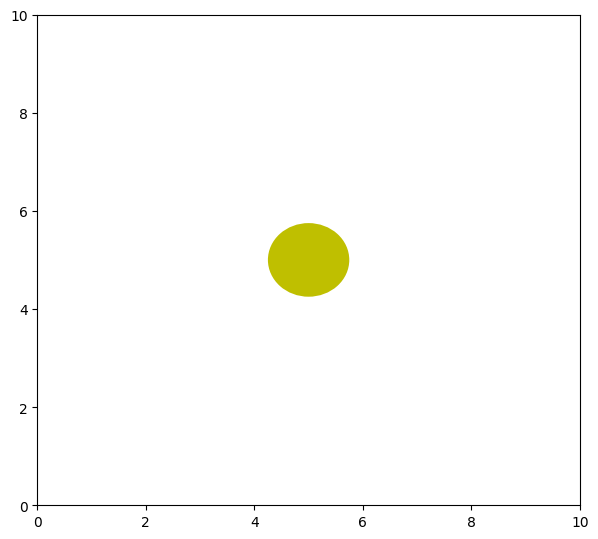

In [7]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation

fig = plt.figure()
fig.set_dpi(100)
fig.set_size_inches(7, 6.5)

ax = plt.axes(xlim=(0, 10), ylim=(0, 10))
patch = plt.Circle((5, -5), 0.75, fc='y')

def init():
    patch.center = (5, 5)
    ax.add_patch(patch)
    return patch,

def animate(i):
    x, y = patch.center
    x = 5 + 3 * np.sin(np.radians(i))
    y = 5 + 3 * np.cos(np.radians(i))
    patch.center = (x, y)
    return patch,

anim = animation.FuncAnimation(fig, animate, 
                               init_func=init, 
                               frames=360, 
                               interval=20,
                               blit=True)

plt.show()